In [ ]:
# @title Texto de título predeterminado
hola = 0
# Paso 1. Instalar las librerías necesarias
# Instalamos las librerías de Hugging Face (diffusers, transformers, accelerate)
# y otras dependencias como imageio para guardar GIFs.
!pip install -q diffusers transformers accelerate imageio[ffmpeg] gradio

print("✅ Librerías instaladas.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 106.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1

In [ ]:
# Paso 2. Importamos módulos y configuramos dispositivo
import torch
from diffusers import StableVideoDiffusionPipeline
from diffusers.utils import load_image, export_to_gif
from PIL import Image
import imageio
import os
from google.colab import files
import gradio as gr # Usaremos Gradio para una interfaz simple

# Verificamos si hay GPU disponible y configurar el dispositivo
if torch.cuda.is_available():
    device = "cuda"
    # Limpiamos caché de memoria de la GPU (útil para este entorno colab)
    torch.cuda.empty_cache()
else:
    # SVD requiere mucha VRAM, es muy improbable que funcione bien en CPU.
    # Se deja como opción pero se advierte al usuario.
    device = "cpu"
    print("⚠️ ADVERTENCIA: Estás usando la CPU. La generación será extremadamente lenta y podría fallar.")
    print("   Asegúrate de haber seleccionado un entorno de ejecución con GPU en Colab.")

print(f"Usando dispositivo: {device}")

# Configuramos los tipo de datos para optimizar memoria (especialmente en GPU)
dtype = torch.float16 if device == "cuda" else torch.float32

print("✅ Módulos importados y dispositivo configurado.")

Usando dispositivo: cuda
✅ Módulos importados y dispositivo configurado.


In [ ]:
# Paso 3. Cargamos el Modelo Stable Video Diffusion (SVD)
# Esto descargará el modelo (varios GB), puede tardar unos minutos la primera vez.

# Elige la versión del modelo:
# 'stabilityai/stable-video-diffusion-img2vid' (versión base, menos VRAM)
# 'stabilityai/stable-video-diffusion-img2vid-xt' (mejor calidad, más VRAM)
model_id = "stabilityai/stable-video-diffusion-img2vid-xt" # Puedes cambiar a la versión base si tienes problemas de memoria

print(f"Cargando el modelo {model_id}...")
try:
    pipe = StableVideoDiffusionPipeline.from_pretrained(
        model_id,
        torch_dtype=dtype,
        variant="fp16" if dtype == torch.float16 else None # Usa pesos fp16 si usamos float16
    )
    if device == "cuda":
        pipe.to(device)
        # Opcional: Habilitar optimizaciones si están disponibles (pueden requerir más VRAM)
        # pipe.enable_model_cpu_offload() # Mueve partes a CPU si falta VRAM, más lento
        # pipe.enable_sequential_cpu_offload() # Alternativa a la anterior
    print("✅ Modelo cargado correctamente.")
except Exception as e:
    print(f"❌ Error al cargar el modelo: {e}")
    print("   Posibles causas: Falta de VRAM (intenta reiniciar el entorno y usar el modelo base), problemas de red.")
    # Detenemos la ejecución si el modelo no carga
    raise SystemExit("Error crítico: No se pudo cargar el modelo SVD.")

Cargando el modelo stabilityai/stable-video-diffusion-img2vid-xt...


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

✅ Modelo cargado correctamente.


In [ ]:
# @title Texto de título predeterminado
# Paso 4. Función para Generar el Vídeo y la Interfaz con Gradio

import time
from IPython.display import display, HTML

last_run_details = {}

# Dimensiones esperadas por el modelo SVD-XT (ajusta si usas otro modelo)
EXPECTED_WIDTH = 1024
EXPECTED_HEIGHT = 576

def generate_video_from_image(input_image, motion_bucket_id=127, noise_level=0.02, num_frames=25, fps=7, seed=42):
    """
    Genera un vídeo a partir de una imagen usando el pipeline SVD cargado
    y guarda los detalles de la ejecución.
    """
    global last_run_details
    last_run_details = {} # Limpiar detalles anteriores al iniciar

    if input_image is None:
        return None, "Por favor, sube una imagen primero."

    print("Procesando imagen...")
    image = Image.fromarray(input_image).convert("RGB")
    original_size = image.size
    image = image.resize((EXPECTED_WIDTH, EXPECTED_HEIGHT))
    print(f"Imagen redimensionada de {original_size} a {image.size}")

    if seed is not None and seed > 0:
       print(f"Estableciendo semilla: {seed}")
       torch.manual_seed(seed)

    print("Generando vídeo...")
    start_time = time.time()

    try:
        # Limpiar caché de memoria ANTES de la generación (puede ayudar)
        if device == "cuda":
            torch.cuda.empty_cache()
            torch.cuda.reset_peak_memory_stats()

        frames = pipe(
            image,
            height=EXPECTED_HEIGHT,
            width=EXPECTED_WIDTH,
            num_frames=num_frames,
            decode_chunk_size=8,
            motion_bucket_id=motion_bucket_id,
            noise_aug_strength=noise_level,
            num_inference_steps=25
        ).frames[0]

        end_time = time.time()
        generation_time = end_time - start_time

        output_path = "generated_video.gif"
        print(f"Guardando vídeo como GIF en {output_path}...")
        export_to_gif(frames, output_path, fps=fps)

        peak_vram_allocated_mb = 0
        peak_vram_reserved_mb = 0
        if device == "cuda":
            peak_vram_allocated_mb = torch.cuda.max_memory_allocated() / (1024**2)
            peak_vram_reserved_mb = torch.cuda.max_memory_reserved() / (1024**2)
            # Opcional: Imprimir memoria actual para depuración
            # current_vram = torch.cuda.memory_allocated() / (1024**2)
            # print(f"Memoria VRAM actual tras generación: {current_vram:.2f} MB")
            # Limpiar caché después
            torch.cuda.empty_cache()

        last_run_details = {
            'status': 'Success',
            'output_path': output_path,
            'params': {
                'input_image_size': original_size,
                'resized_to': image.size,
                'motion_bucket_id': motion_bucket_id,
                'noise_level': noise_level,
                'num_frames': num_frames,
                'fps': fps,
                'seed': seed
            },
            'metrics': {
                'generation_time_sec': generation_time,
                'peak_vram_allocated_mb': peak_vram_allocated_mb,
                'peak_vram_reserved_mb': peak_vram_reserved_mb,
                'device': device
            }
        }

        print(f"✅ ¡Vídeo generado con éxito en {generation_time:.2f} segundos!")
        return output_path, "Vídeo generado con éxito."

    except torch.cuda.OutOfMemoryError:
        end_time = time.time()
        generation_time = end_time - start_time
        print(f"❌ Error: ¡Memoria de GPU insuficiente (CUDA OutOfMemoryError) tras {generation_time:.2f} s!")
        print("   Intenta reducir 'num_frames', 'decode_chunk_size', o usa el modelo base ('stable-video-diffusion-img2vid').")
        if device == "cuda": torch.cuda.empty_cache()
        last_run_details = {'status': 'Failure: Out of Memory', 'metrics': {'generation_time_sec': generation_time}}
        return None, "Error: Memoria GPU insuficiente. Reduce parámetros o usa modelo base."
    except Exception as e:
        end_time = time.time()
        generation_time = end_time - start_time
        print(f"❌ Error inesperado durante la generación tras {generation_time:.2f} s: {e}")
        last_run_details = {'status': f'Failure: {e}', 'metrics': {'generation_time_sec': generation_time}}
        return None, f"Error inesperado: {e}"

# Crear la interfaz de Gradio
print("Creando interfaz...")
with gr.Blocks() as demo:
    gr.Markdown("# 🎬 Generador de Vídeo con Stable Video Diffusion")
    gr.Markdown("Sube una imagen y ajusta los parámetros para darle 'vida'.")

    with gr.Row():
        with gr.Column():
            input_image = gr.Image(label="Imagen de Entrada", type="numpy")
            motion_bucket_id = gr.Slider(label="ID de Cubo de Movimiento (Motion Bucket ID)", minimum=1, maximum=255, value=127, step=1, info="Controla la cantidad de movimiento percibido.")
            noise_level = gr.Slider(label="Nivel de Ruido Añadido (Noise Aug Strength)", minimum=0.0, maximum=0.2, value=0.02, step=0.01, info="Cuánto ruido añadir a la imagen inicial (más ruido = más cambio).")
            num_frames = gr.Slider(label="Número de Frames", minimum=10, maximum=50, value=25, step=1, info="Duración del vídeo.")
            fps = gr.Slider(label="Frames por Segundo (FPS)", minimum=5, maximum=30, value=7, step=1, info="Velocidad de reproducción.")
            seed = gr.Number(label="Semilla (Seed)", value=42, precision=0, info="Deja 0 o negativo para aleatorio, usa un número fijo para reproducibilidad.") # precision=0 para entero
            generate_button = gr.Button("✨ Generar Vídeo")
        with gr.Column():
            output_video = gr.Image(label="Vídeo Generado (GIF)", type="filepath") # Usamos Image para mostrar GIF
            status_message = gr.Textbox(label="Estado")

    generate_button.click(
        fn=generate_video_from_image,
        inputs=[input_image, motion_bucket_id, noise_level, num_frames, fps, seed],
        outputs=[output_video, status_message]
    )

print("✅ Interfaz creada. Lanzando...")
# Lanzar la interfaz de Gradio CON share=True
# Abre el enlace público que termina en '.gradio.live' en una nueva pestaña.
demo.launch(share=True, debug=True)

Creando interfaz...
✅ Interfaz creada. Lanzando...
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://cae27b37ed1f7b8c51.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Procesando imagen...
Imagen redimensionada de (1280, 720) a (1024, 576)
Estableciendo semilla: 42
Generando vídeo...


  0%|          | 0/25 [00:00<?, ?it/s]

Guardando vídeo como GIF en generated_video.gif...
✅ ¡Vídeo generado con éxito en 41.10 segundos!
Procesando imagen...
Imagen redimensionada de (3335, 5032) a (1024, 576)
Estableciendo semilla: 42
Generando vídeo...


  0%|          | 0/25 [00:00<?, ?it/s]

Guardando vídeo como GIF en generated_video.gif...
✅ ¡Vídeo generado con éxito en 41.14 segundos!
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://cae27b37ed1f7b8c51.gradio.live


In [ ]:
# Paso 5. (Opcional) Descargar el último vídeo generado
# Ejecuta esta celda DESPUÉS de generar un vídeo con la interfaz si quieres descargarlo directamente.

if os.path.exists("generated_video.gif"):
    print("Descargando generated_video.gif...")
    files.download("generated_video.gif")
else:
    print("No se encontró el archivo 'generated_video.gif'. ¿Generaste un vídeo primero?")

# Descomenta si también guardaste MP4 y quieres descargarlo
# if os.path.exists("generated_video.mp4"):
#     print("Descargando generated_video.mp4...")
#     files.download("generated_video.mp4")

Descargando generated_video.gif...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mostrando detalles de la última ejecución...


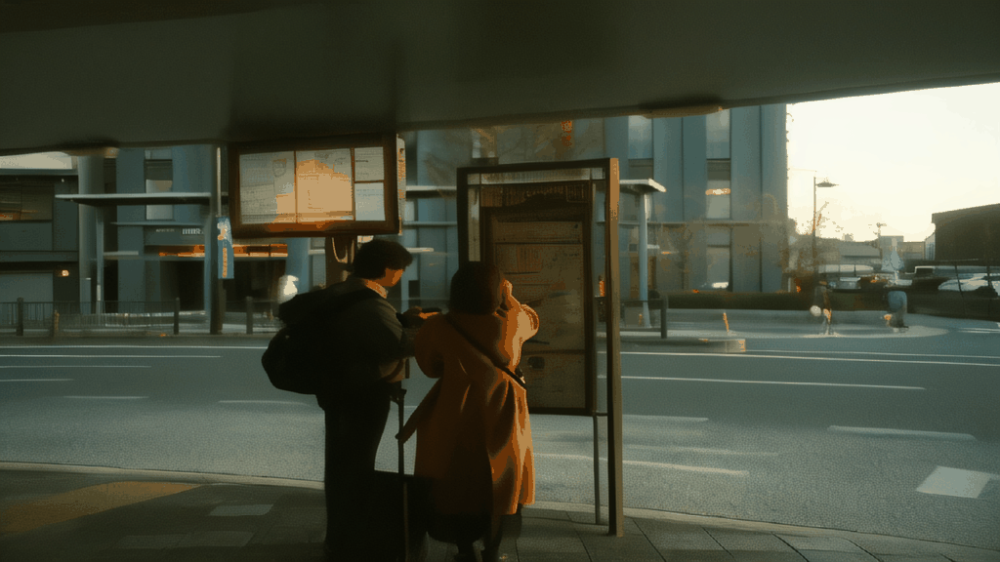

In [ ]:
# Paso 6. Presentación de Resultados y Métricas de la Última Ejecución

from IPython.display import display, Image, HTML, Markdown # Importamos Markdown también
import os

# Verificamos si hay detalles de la última ejecución
if 'last_run_details' in globals() and last_run_details:
    print("Mostrando detalles de la última ejecución...")

    # Mostramos estado
    status = last_run_details.get('status', 'Desconocido')
    if status == 'Success':
        display(HTML(f"<h2>✅ Estado: <span style='color:green;'>{status}</span></h2>"))

        # --- Mostramos Resultado Visual ---
        output_path = last_run_details.get('output_path')
        if output_path and os.path.exists(output_path):
            display(HTML("<h3>🎬 Vídeo Generado:</h3>"))
            display(Image(filename=output_path, width=512)) # Ajustamos el ancho si quieres
        else:
            display(HTML("<p style='color:orange;'>Advertencia: No se encontró el archivo de vídeo generado.</p>"))

        # --- Mostramos Parámetros Usados ---
        params = last_run_details.get('params', {})
        if params:
            display(HTML("<h3>⚙️ Parámetros Utilizados:</h3>"))
            param_html = "<ul>"
            param_html += f"<li><b>Tamaño Imagen Original:</b> {params.get('input_image_size', 'N/A')}</li>"
            param_html += f"<li><b>Imagen Redimensionada a:</b> {params.get('resized_to', 'N/A')}</li>"
            param_html += f"<li><b>Motion Bucket ID:</b> {params.get('motion_bucket_id', 'N/A')}</li>"
            param_html += f"<li><b>Noise Level:</b> {params.get('noise_level', 'N/A')}</li>"
            param_html += f"<li><b>Número de Frames:</b> {params.get('num_frames', 'N/A')}</li>"
            param_html += f"<li><b>FPS:</b> {params.get('fps', 'N/A')}</li>"
            param_html += f"<li><b>Seed:</b> {params.get('seed', 'N/A')}</li>"
            param_html += "</ul>"
            display(HTML(param_html))

        # --- Mostramos Métricas de Rendimiento ---
        metrics = last_run_details.get('metrics', {})
        if metrics:
            display(HTML("<h3>⏱️ Métricas de Rendimiento:</h3>"))
            metrics_html = "<ul>"
            metrics_html += f"<li><b>Tiempo de Generación:</b> {metrics.get('generation_time_sec', 0):.2f} segundos</li>"
            # Mostramos métricas de VRAM solo si se usó GPU
            if metrics.get('device') == 'cuda':
                metrics_html += f"<li><b>Pico VRAM Allocada (PyTorch):</b> {metrics.get('peak_vram_allocated_mb', 0):.2f} MB</li>"
                metrics_html += f"<li><b>Pico VRAM Reservada (PyTorch):</b> {metrics.get('peak_vram_reserved_mb', 0):.2f} MB</li>"
            else:
                 metrics_html += f"<li><b>Dispositivo:</b> CPU (Métricas de VRAM no aplicables)</li>"
            metrics_html += "</ul>"
            display(HTML(metrics_html))

    else: # Si el estado no fue 'Success'
        display(HTML(f"<h2>❌ Estado: <span style='color:red;'>{status}</span></h2>"))
        metrics = last_run_details.get('metrics', {})
        if 'generation_time_sec' in metrics:
             display(HTML(f"<p>La ejecución falló tras {metrics['generation_time_sec']:.2f} segundos.</p>"))
        display(HTML("<p>No se generó ningún vídeo. Revisa los logs de la celda 4 para más detalles.</p>"))

else:
    display(Markdown("**No se han encontrado detalles de una ejecución previa.** Por favor, genera un vídeo usando la interfaz en la celda 4 primero."))